In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [2]:
import commot as ct
import scanpy as sc
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

In [3]:
%matplotlib inline

In [4]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.3 pandas==1.3.5 scikit-learn==1.1.3 statsmodels==0.13.5 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.8


In [5]:
import scanpy as sc
import anndata as ad
import squidpy as sq

In [6]:
import os

In [7]:
adata1 = sq.read.nanostring(
    path ='../0507/',
    counts_file='Run5458_0507_exprMat_file.csv',
    meta_file='Run5458_0507_metadata_file.csv',
    fov_file='Run5458_0507_fov_positions_file.csv',
)

In [8]:
adata2 = sq.read.nanostring(
    path='../5006/',
    counts_file='Run5458_5006_exprMat_file.csv',
    meta_file='Run5458_5006_metadata_file.csv',
    fov_file='Run5458_5006_fov_positions_file.csv',
)

In [9]:
adata3 = sq.read.nanostring(
    path='/data/share/spatial/CosMX/normal_stomach/tsubosaka/FinalAnalysis/Run5495_23T53T/',
    counts_file='Run5495_23T53T_exprMat_file.csv',
    meta_file='Run5495_23T53T_metadata_file.csv',
    fov_file='Run5495_23T53T_fov_positions_file.csv',
)

In [9]:
adata1.obs['tissue'] = 'Pyloric'
adata2.obs['tissue'] = 'Fundic'
#adata3.obs['tissue'] = 'Cancer'

In [10]:
adata = ad.concat([adata1,adata2], uns_merge="only", join='outer', index_unique='-',label='tissue')

In [11]:
adata1

AnnData object with n_obs × n_vars = 137024 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [12]:
adata2

AnnData object with n_obs × n_vars = 131302 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [13]:
adata

AnnData object with n_obs × n_vars = 268326 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [14]:
moji = []
for i in range(adata1.obs.index.shape[0]):
    index = adata1.obs.index[i]
    indexes = index.split('_')
    if int(indexes[1]) < 10:
        moji.append('Pyloric-fov00'+indexes[1]+'-cell_'+indexes[0])
    else:
        moji.append('Pyloric-fov0'+indexes[1]+'-cell_'+indexes[0])
"""
        if int(indexes[1]) < 10:
            moji.append('Fundic-fov00'+indexes[1]+'-cell_'+indexes[0])
        else:
            moji.append('Fundic-fov0'+indexes[1]+'-cell_'+indexes[0])
"""

"\n        if int(indexes[1]) < 10:\n            moji.append('Fundic-fov00'+indexes[1]+'-cell_'+indexes[0])\n        else:\n            moji.append('Fundic-fov0'+indexes[1]+'-cell_'+indexes[0])\n"

In [15]:
adata1.obs.index = moji

In [16]:
moji = []
for i in range(adata2.obs.index.shape[0]):
    index = adata2.obs.index[i]
    indexes = index.split('_')
    if int(indexes[1]) < 10:
        moji.append('Fundic-fov00'+indexes[1]+'-cell_'+indexes[0])
    else:
        moji.append('Fundic-fov0'+indexes[1]+'-cell_'+indexes[0])

"""    if int(indexes[1]) < 10:
        moji.append('Pyloric-fov00'+indexes[1]+'-cell_'+indexes[0])
    else:
        moji.append('Pyloric-fov0'+indexes[1]+'-cell_'+indexes[0])
"""
    

"    if int(indexes[1]) < 10:\n        moji.append('Pyloric-fov00'+indexes[1]+'-cell_'+indexes[0])\n    else:\n        moji.append('Pyloric-fov0'+indexes[1]+'-cell_'+indexes[0])\n"

In [17]:
adata2.obs.index = moji

In [18]:
moji = []
for i in range(adata3.obs.index.shape[0]):
    index = adata3.obs.index[i]
    indexes = index.split('_')
    if int(indexes[1]) < 10:
        moji.append('Tumor-fov00'+indexes[1]+'-cell_'+indexes[0])
    else:
        moji.append('Tumor-fov0'+indexes[1]+'-cell_'+indexes[0])

"""    if int(indexes[1]) < 10:
        moji.append('Pyloric-fov00'+indexes[1]+'-cell_'+indexes[0])
    else:
        moji.append('Pyloric-fov0'+indexes[1]+'-cell_'+indexes[0])
"""
    

NameError: name 'adata3' is not defined

In [27]:
adata3.obs.index = moji

NameError: name 'adata3' is not defined

In [28]:
adata

AnnData object with n_obs × n_vars = 268326 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [29]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [30]:
sc.pp.filter_cells(adata, min_counts=20)
adata = adata[adata.obs['Area'] < np.mean(adata.obs['Area']) * 5]

In [31]:
adata[adata.obs['tissue'] == "0"]

View of AnnData object with n_obs × n_vars = 130067 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [32]:
adata[adata.obs['tissue'] == "1"]

View of AnnData object with n_obs × n_vars = 115160 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [33]:
adata[adata.obs['tissue'] == "2"]

View of AnnData object with n_obs × n_vars = 0 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

KeyError: "`library_id`: ['25']` not found in `['24']`."

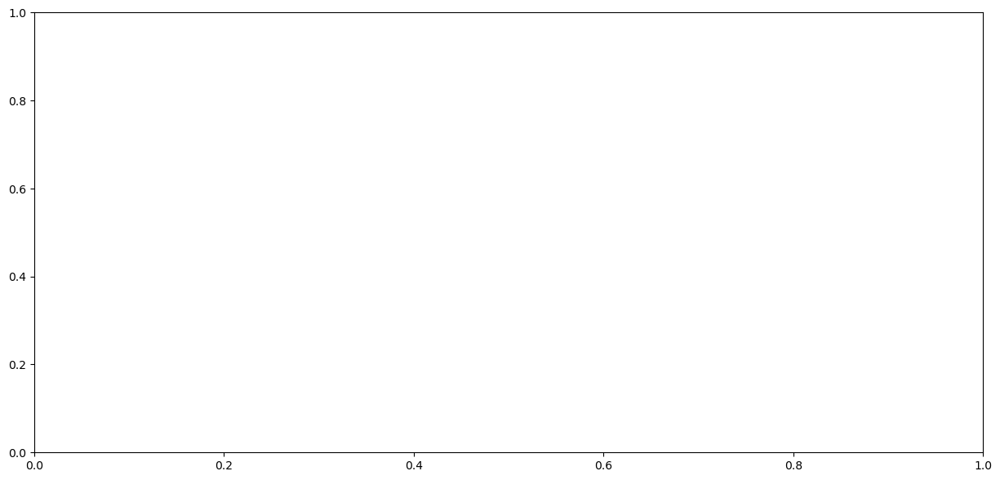

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sq.pl.spatial_segment(
    adata[adata.obs['tissue'] == "2"],
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="25",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    legend_loc=None
)

In [ ]:
adata1.var_names_make_unique()
adata1.var["mt"] = adata1.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata1, qc_vars=["mt"], inplace=True)

In [ ]:
adata2.var_names_make_unique()
adata2.var["mt"] = adata1.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata2, qc_vars=["mt"], inplace=True)

In [ ]:
adata3.var_names_make_unique()
adata3.var["mt"] = adata1.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata3, qc_vars=["mt"], inplace=True)

### plot the metrics

<AxesSubplot: xlabel='n_genes_by_counts'>

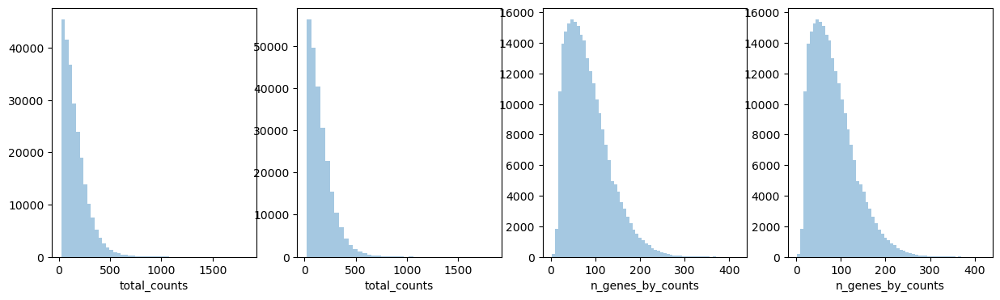

In [26]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.distplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.distplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.distplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

<AxesSubplot: xlabel='n_genes_by_counts'>

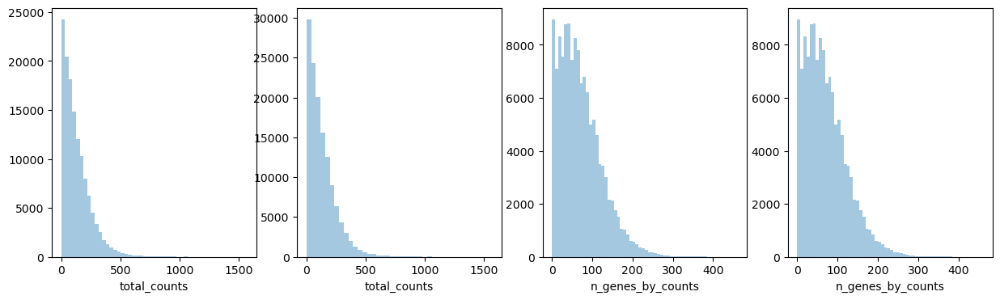

In [18]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(
    adata2.obs["total_counts"],
    kde=False,
    ax=axs[0],
)
sns.distplot(
    adata2.obs["total_counts"][adata2.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.distplot(
    adata2.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[2],
)
sns.distplot(
    adata2.obs["n_genes_by_counts"][adata2.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

## filtering

In [35]:
sc.pp.filter_cells(adata1, min_counts=20)
adata1 = adata1[adata1.obs['Area'] < np.mean(adata1.obs['Area']) * 5]

In [36]:
sc.pp.filter_cells(adata2, min_counts=20)
adata2 = adata2[adata2.obs['Area'] < np.mean(adata2.obs['Area']) * 5]

In [37]:
adata1

View of AnnData object with n_obs × n_vars = 130045 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [38]:
adata2

View of AnnData object with n_obs × n_vars = 115200 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

## match ID

In [39]:
adata = sc.read_h5ad('../cosmx_all_seurat_final_before_submission.h5ad')

In [40]:
adata.obs['cell_types'] = pd.DataFrame(adata.obs['new_clus'])

In [41]:
adata.obs['cell_types']

Pyloric-fov001-cell_1      T CD8 memory
Pyloric-fov001-cell_3      T CD8 memory
Pyloric-fov001-cell_4        macrophage
Pyloric-fov001-cell_5      T CD4 memory
Pyloric-fov001-cell_7           Stromal
                               ...     
Fundic-fov024-cell_4849           GKN+F
Fundic-fov024-cell_4856     endothelial
Fundic-fov024-cell_4857    T CD8 memory
Fundic-fov024-cell_4858        pericyte
Fundic-fov024-cell_4929           GKN+F
Name: cell_types, Length: 244445, dtype: object

In [42]:
adata1_ = adata[adata.obs.index.isin(adata1.obs.index)]

In [43]:
adata2_ = adata[adata.obs.index.isin(adata2.obs.index)]

In [44]:
adata1_

View of AnnData object with n_obs × n_vars = 129818 × 960
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_ID', 'list_ID', 'fov', 'cell_ID2', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'site', 'cell_ID_2', 'nr_feats', 'perc_feats', 'total_expr', 'cell_types', 'major_clus', 'major_clus2', 'new_clus'
    var: 'features'
    obsm: 'X_tsne', 'X_umap'

In [45]:
adata2_

View of AnnData object with n_obs × n_vars = 114627 × 960
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cell_ID', 'list_ID', 'fov', 'cell_ID2', 'Area', 'AspectRatio', 'CenterX_local_px', 'CenterY_local_px', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'site', 'cell_ID_2', 'nr_feats', 'perc_feats', 'total_expr', 'cell_types', 'major_clus', 'major_clus2', 'new_clus'
    var: 'features'
    obsm: 'X_tsne', 'X_umap'

In [46]:
adata1.obs['cell_types'] = adata1_.obs['new_clus']
adata2.obs['cell_types'] = adata2_.obs['new_clus']

In [47]:
adata1.obs.dropna(inplace=True)

In [48]:
adata2.obs.dropna(inplace=True)

In [49]:
adata1 = adata1[adata1.obs.index.isin(adata1_.obs.index)]

In [50]:
adata2 = adata2[adata2.obs.index.isin(adata2_.obs.index)]

In [51]:
adata1

View of AnnData object with n_obs × n_vars = 129818 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_counts', 'cell_types'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [52]:
adata2

View of AnnData object with n_obs × n_vars = 114627 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_counts', 'cell_types'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [37]:
adata1.write_h5ad("../Fundic_trial.h5ad")
adata2.write_h5ad("../Pyloric_trial.h5ad")

## calculate the UMAP etc

In [28]:
adata.layers["counts"] = adata.X.copy()
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=1000)
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)

sc.tl.leiden(adata)

In [29]:
sc.tl.umap(adata,min_dist=0.1)

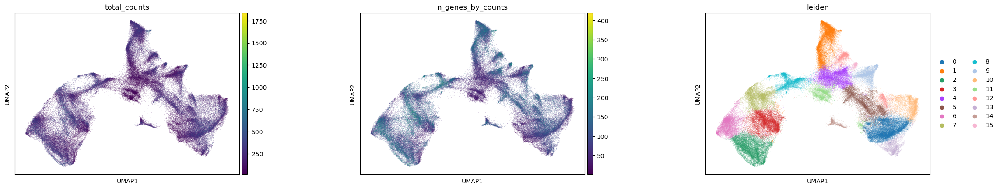

In [30]:
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace=0.4,
)

sq.pl.spatial_segment(
    adata,
    color="Max.CD45", 
    seg_cell_id="cell_ID",
)

## plot the immune

In [ ]:
sq.pl.spatial_segment(
    adata,
    color="Max.CD45",
    library_key="fov",
    seg_cell_id="cell_ID",
)

In [ ]:
sq.pl.spatial_segment(
    adata,
    color="Max.CD45",
    library_key="fov",
    seg_cell_id="cell_ID",
)

In [ ]:
sq.pl.spatial_segment(
    adata,
    color="Max.MembraneStain",
    library_key="fov",
    seg_cell_id="cell_ID",
)

# Return analysis

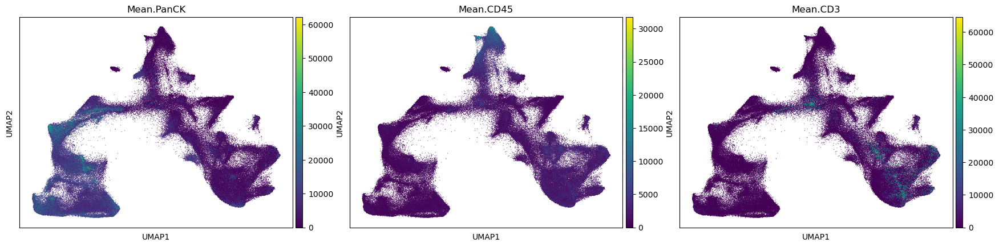

In [142]:
sc.pl.umap(
    adata3,
    color=['Mean.PanCK','Mean.CD45','Mean.CD3'
    ],wspace=0.1,size=2,save='save.png'
)

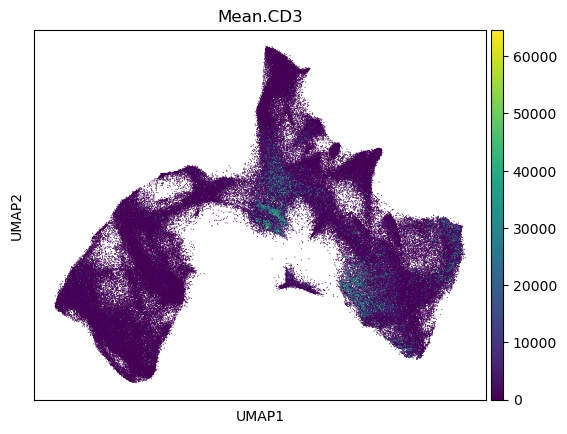

In [130]:
sc.pl.umap(
    adata,
    color=['Mean.CD3',
    ],wspace=0.2,size=2
)

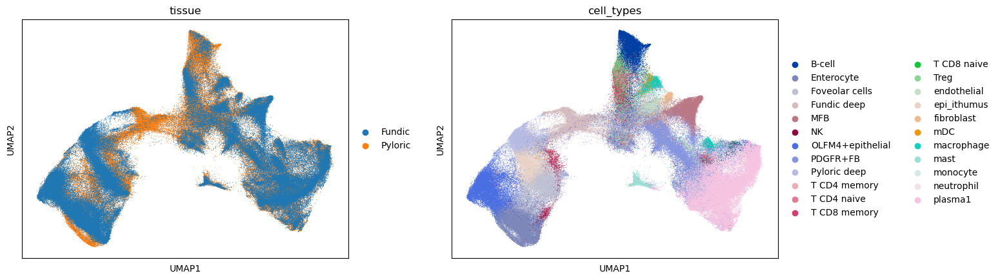

In [129]:
sc.pl.umap(
    adata,
    color=['tissue',
        "cell_types"
    ],wspace=0.2,size=2
)

In [ ]:
color_set <- c('Foveolar'='#FFFFCC',
                                           'GKN+F'='#C7E9B4',
                                           'ADH1+GKN1-F'='#7FCDBB',
                                           'PG/Neck1'='#41B6C4',
                                           'Chief'='#2C7FB8',
                                           'PC'='#253494',
                                           'PG/Neck2'='#31A354',
                                           'Pyloric_deep'='#006837',
                                           'Ent'='#FEE5D9',
                                           'TA_Ent'='#FB6A4A',
                                           'Ent2'='#FCAE91',
                                           'OLFM4+Epi'='#CB181D',
                                           'Gob'='blue',
                                           'NE1'='Salmon',
                                           'NE2'='yellow',
                                           'LEFTY1_epi'='red',
                                           'B-cell'='#87CEEB',
                                           'pro_B-cell'='#90EE90',
                                           'plasma'='#DDA0DD',
                                           'T CD4 memory'='#696969',
                                           'T CD8 memory'='#556B2F',
                                           'T CD4 naive'='#696969',
                                           'T CD8 naive'='#556B2F',
                                           'Treg'='#800000',
                                           'NK'='black',
                                           'macrophage'='#F0E68C',
                                           'mast'='#F0E68C',
                                           'mDC'='#F0E68C',
                                           'monocyte'='#F0E68C',
                                           'pDC'='#F0E68C',
                                           'neutrophil'='#EE82EE',
                                           'CCL11+FB'='#4682B4',
                                           'KLF+FB'='Cyan',
                                           'PDGFR+FB'='Gray',
                                           'pericyte'='pink',
                                           'FibSmo'='#FFD700',
                                           'Stromal'='#ADFF2F',
                                           'pericyte_SM'='#FAFAD2',
                                           'endothelial'='#B22222')

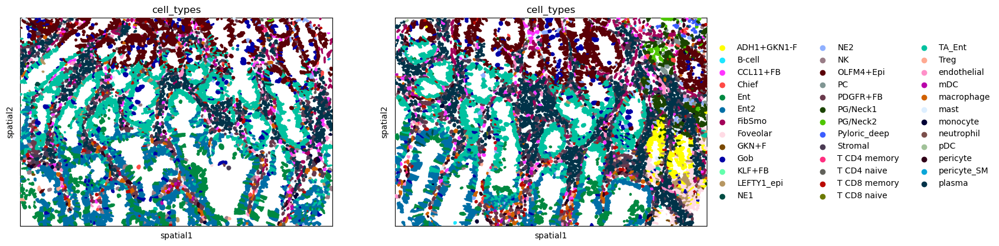

In [38]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata1,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="12",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
    legend_loc=None
)

sq.pl.spatial_segment(
    adata1,
    color="cell_types",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="13",
    img=False,
    size=60,
    ax=ax[1],
)

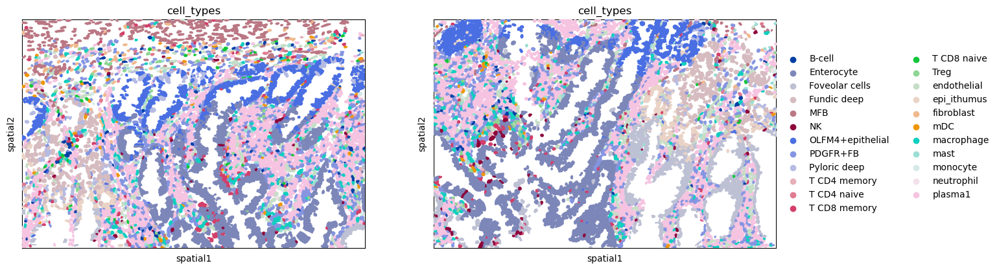

In [100]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
sq.pl.spatial_segment(
    adata2,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="12",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax[0],
    legend_loc=None,
)

sq.pl.spatial_segment(
    adata2,
    color="cell_types",
    seg_cell_id="cell_ID",
    library_key="fov",
    library_id="13",
    img=False,
    size=60,
    ax=ax[1],
)

# Neighboring analysis

In [102]:
sq.gr.spatial_neighbors(adata1, coord_type="generic", spatial_key="spatial")

In [103]:
sq.gr.nhood_enrichment(adata1, cluster_key="cell_types")

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:13<00:00, 73.99/s]


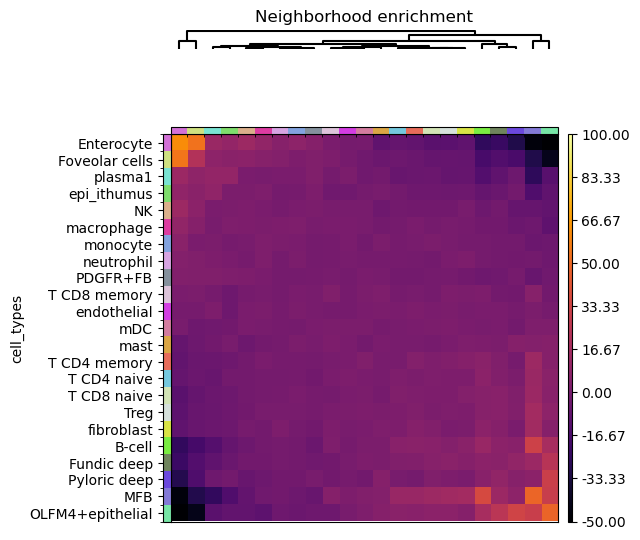

In [104]:
sq.pl.nhood_enrichment(adata1, cluster_key="cell_types", method="average", cmap="inferno", vmin=-50, vmax=100, figsize=(5,5))

In [137]:
n_clusters = [5]

In [138]:
df_nhood_enr = pd.DataFrame(adata1.uns['cell_types_nhood_enrichment']['zscore'], columns=adata1.obs.cell_types.unique(), index=adata1.obs.cell_types.unique())

In [139]:
nhood_cluster_levels = ['Level-' + str(x) for x in n_clusters]

In [140]:
from scipy.cluster import hierarchy as sch

In [141]:
linkage = sch.linkage(df_nhood_enr, method='average')

In [142]:
mat_nhood_clusters = sch.cut_tree(linkage, n_clusters=n_clusters)

In [143]:
ser_counts = adata1.obs['cell_types'].value_counts()
ser_counts.name = 'cell counts'
meta_leiden = pd.DataFrame(ser_counts)

In [144]:
df_cluster = pd.DataFrame(mat_nhood_clusters, columns=nhood_cluster_levels,
                                index=meta_leiden.index.tolist())

In [145]:
inst_level = 'Level-' + str(n_clusters[0])

In [146]:
all_clusters = list(df_cluster[inst_level].unique())

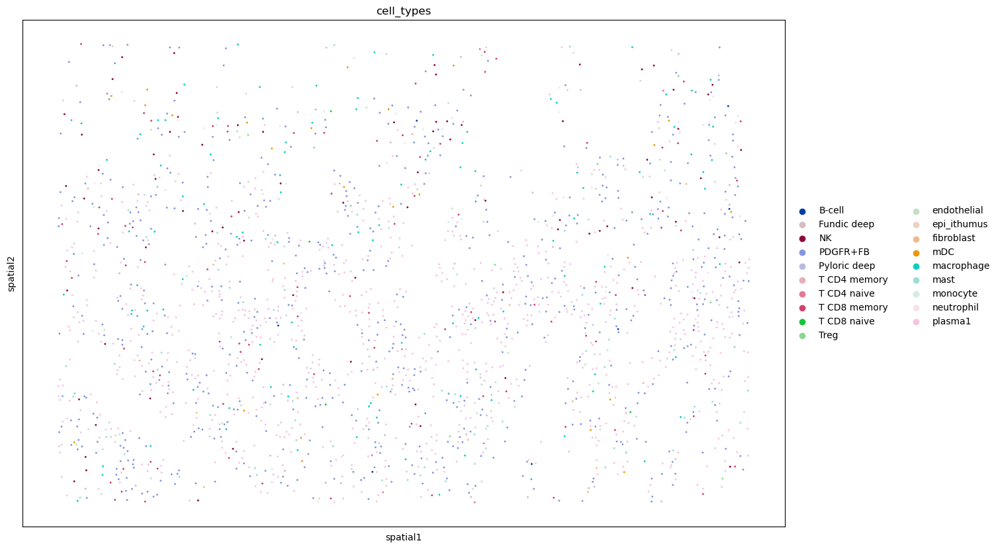

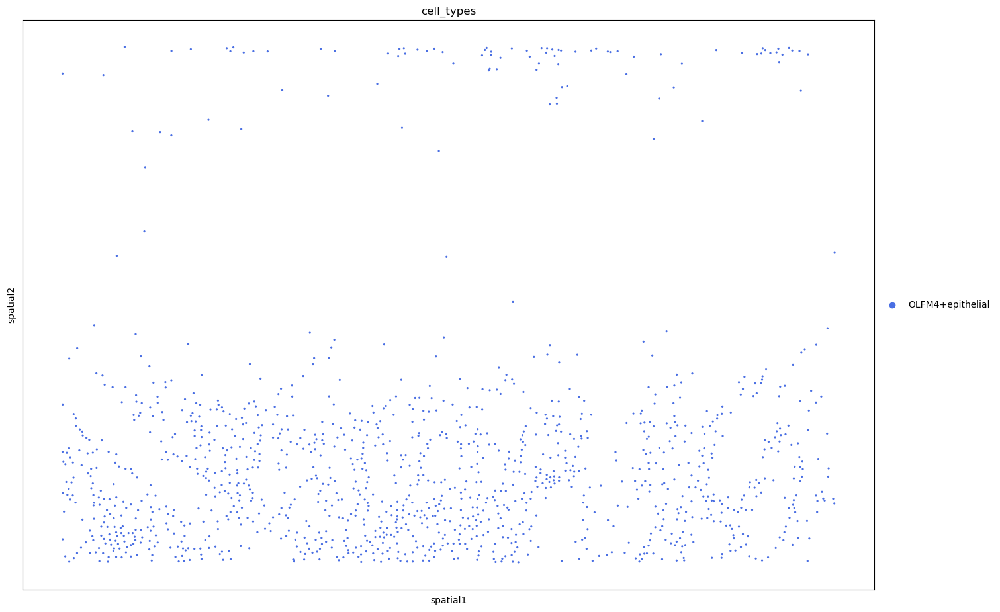

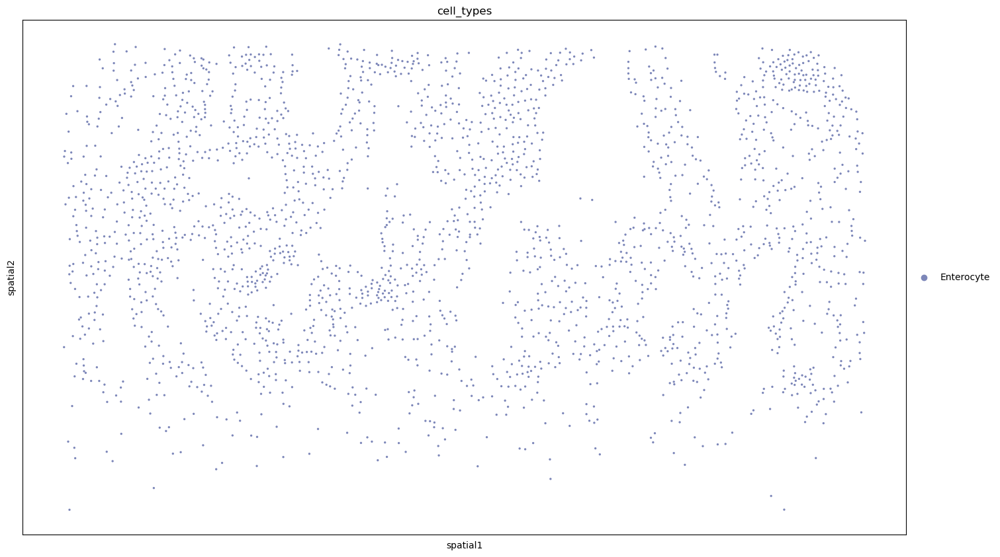

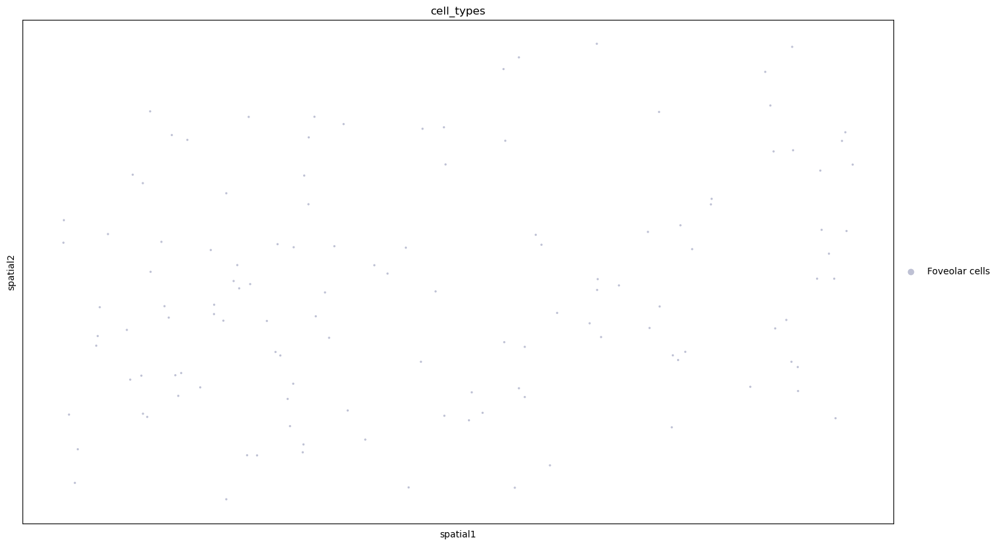

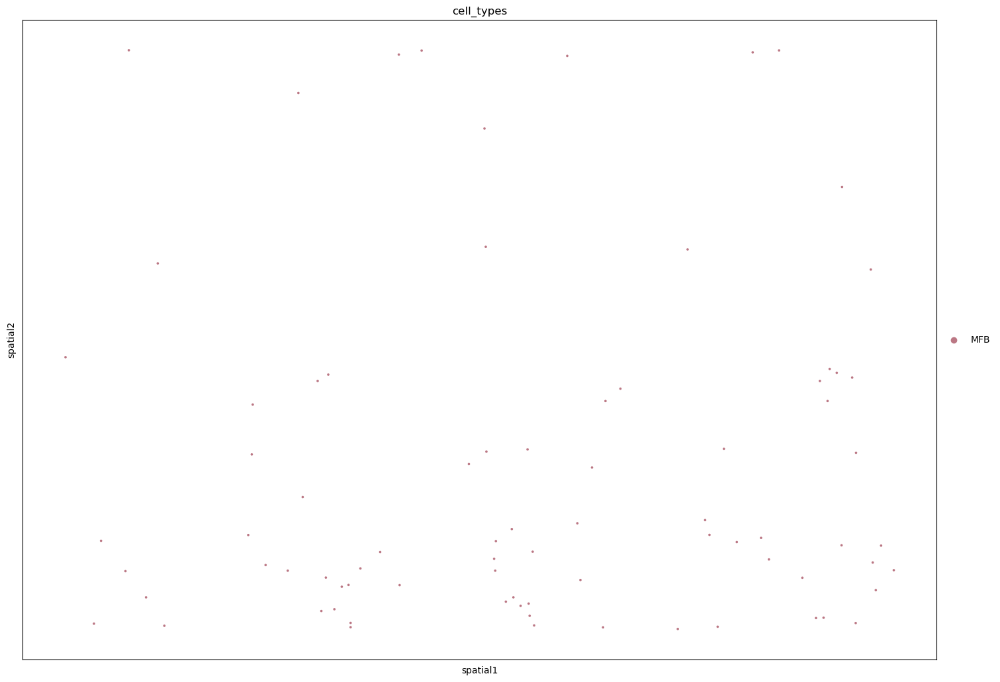

In [148]:
# sc.set_figure_params(figsize=(10,10))
for inst_cluster in all_clusters:
    inst_clusters = df_cluster[df_cluster[inst_level] == inst_cluster].index.tolist()

    sq.pl.spatial_scatter(
      adata1,
      groups=inst_clusters,
      color="cell_types",
    library_key="fov",
    library_id="12",
    seg_cell_id="cell_ID",
      size=15,
      img=False,
      figsize=(15, 15)
  )

In [115]:
adata_spatial_neighbor = sq.gr.spatial_neighbors(
    adata1, coord_type="generic", delaunay=True
)

In [116]:
sq.gr.centrality_scores(adata1, cluster_key="cell_types")

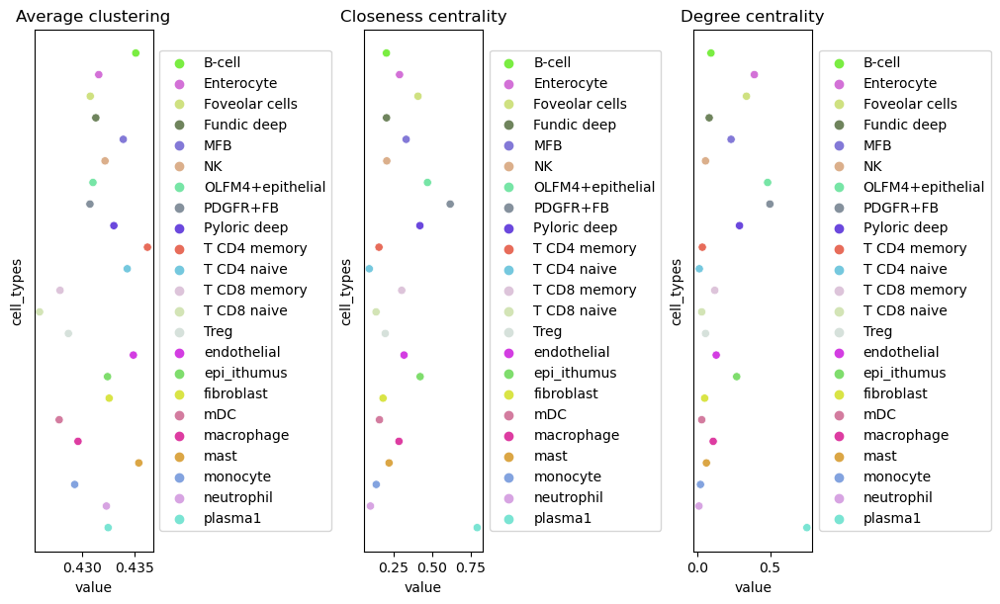

In [117]:
sq.pl.centrality_scores(adata1, cluster_key="cell_types", figsize=(10, 6))

In [120]:
adata_subset = adata1[adata1.obs.fov == "1"].copy()

In [121]:
sq.gr.spatial_neighbors(adata_subset, coord_type="generic", delaunay=True)
sq.gr.spatial_autocorr(
    adata_subset,
    mode="moran",
    n_perms=100,
    n_jobs=1,
)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [09:03<00:00,  5.43s/]


,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
LYZ,0.618343,0.0,0.00005,0.0,0.009901,0.000074,0.0,0.0,0.015584
IGHA1,0.543171,0.0,0.00005,0.0,0.009901,0.000083,0.0,0.0,0.015584
LTF,0.539554,0.0,0.00005,0.0,0.009901,0.000083,0.0,0.0,0.015584
AGR2,0.537825,0.0,0.00005,0.0,0.009901,0.000084,0.0,0.0,0.015584
LCN2,0.532819,0.0,0.00005,0.0,0.009901,0.000077,0.0,0.0,0.015584
JCHAIN,0.519451,0.0,0.00005,0.0,0.009901,0.000076,0.0,0.0,0.015584
PIGR,0.508948,0.0,0.00005,0.0,0.009901,0.000077,0.0,0.0,0.015584
KRT8,0.505983,0.0,0.00005,0.0,0.009901,0.000051,0.0,0.0,0.015584
S100A6,0.478613,0.0,0.00005,0.0,0.009901,0.000066,0.0,0.0,0.015584
KRT20,0.467551,0.0,0.00005,0.0,0.009901,0.000066,0.0,0.0,0.015584


In [124]:
adata_subset.uns["moranI"].head(20)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
LYZ,0.618343,0.0,0.00005,0.0,0.009901,0.000074,0.0,0.0,0.015584
IGHA1,0.543171,0.0,0.00005,0.0,0.009901,0.000083,0.0,0.0,0.015584
LTF,0.539554,0.0,0.00005,0.0,0.009901,0.000083,0.0,0.0,0.015584
AGR2,0.537825,0.0,0.00005,0.0,0.009901,0.000084,0.0,0.0,0.015584
LCN2,0.532819,0.0,0.00005,0.0,0.009901,0.000077,0.0,0.0,0.015584
JCHAIN,0.519451,0.0,0.00005,0.0,0.009901,0.000076,0.0,0.0,0.015584
PIGR,0.508948,0.0,0.00005,0.0,0.009901,0.000077,0.0,0.0,0.015584
KRT8,0.505983,0.0,0.00005,0.0,0.009901,0.000051,0.0,0.0,0.015584
S100A6,0.478613,0.0,0.00005,0.0,0.009901,0.000066,0.0,0.0,0.015584
KRT20,0.467551,0.0,0.00005,0.0,0.009901,0.000066,0.0,0.0,0.015584


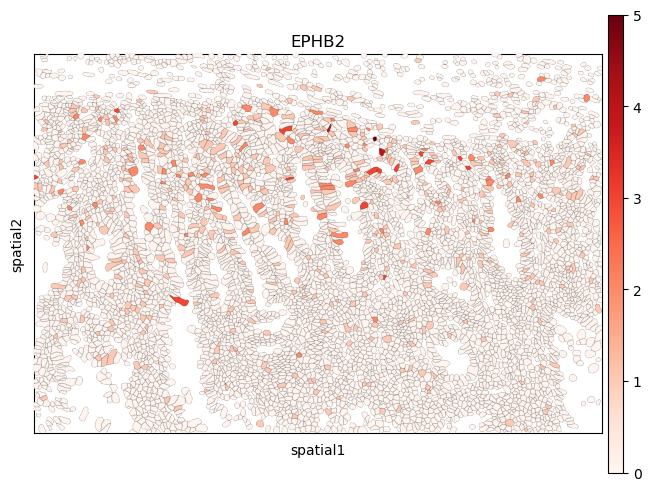

In [43]:
sq.pl.spatial_segment(
    adata1,
    library_id="1",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["EPHB2"],
    size=60,
    img=False,
    cmap = 'Reds',seg_outline=True
)

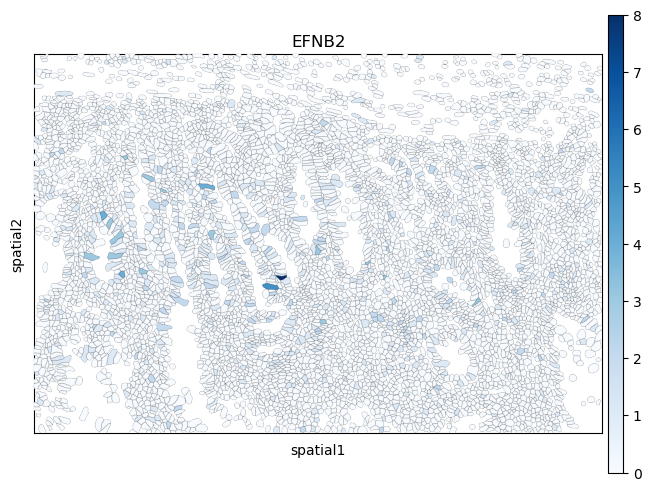

In [45]:
sq.pl.spatial_segment(
    adata1,
    library_id="1",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=["EFNB2"],
    size=60,
    img=False,
    cmap = 'Blues',seg_outline=True
)

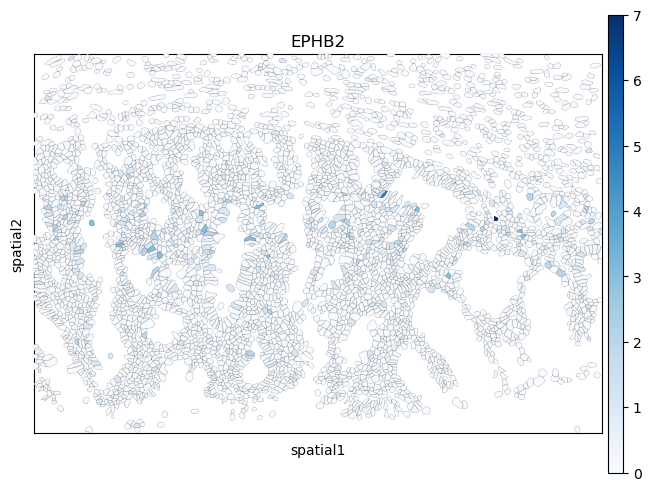

In [182]:
sq.pl.spatial_segment(
    adata2,
    library_id="20",
    seg_cell_id="cell_ID",
    library_key="fov",
    color=['EPHB2'],
    size=60,
    img=False,    
    cmap = 'Blues',seg_outline=True
)

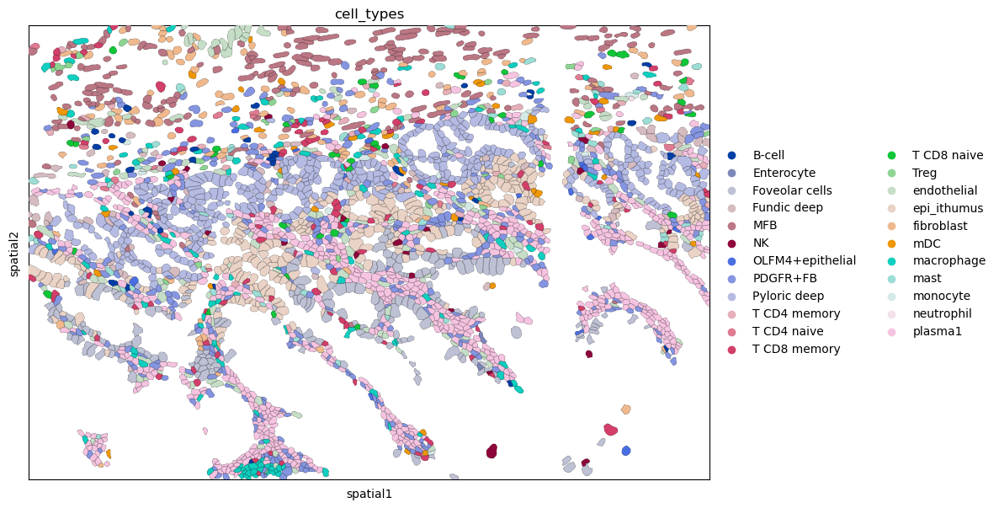

In [201]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sq.pl.spatial_segment(
    adata2,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="19",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax,seg_outline=True
)

In [ ]:
sq.pl.spatial_segment(
    adata2,
    color=['LEFTY1','EPHB2','CD44'],
    img_alpha=0.8,
    library_key="fov",
    library_id="19",
    seg_cell_id="cell_ID",
    seg_contourpx=10,
    crop_coord=[(2000, 1500, 3000, 2500)],
)

In [ ]:
sq.pl.spatial_segment(
    adata1,
    color="LEFTY1",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False
)

In [ ]:
sq.pl.spatial_segment(
    adata1,
    color="LEFTY1",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False
)

In [ ]:
sq.pl.spatial_segment(
    adata2,
    color="LEFTY1",
    library_key="fov",
    seg_cell_id="cell_ID",
    img=False
)

# Cell-Cell Communication (Squidpy)

In [44]:
adata1[adata1.obs['fov'] == '1']

View of AnnData object with n_obs × n_vars = 6781 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'cell_types'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_fov'

In [ ]:
adata1_sub = adata1[adata1.obs.index.isin(adata1.obs.index)]

In [48]:
adata1.obs['cell_types'] = adata1.obs['cell_types'].astype('category')

In [101]:
adata1.write_h5ad("../Fundic_trial.h5ad")
adata2.write_h5ad("../Pyloric_trial.h5ad")

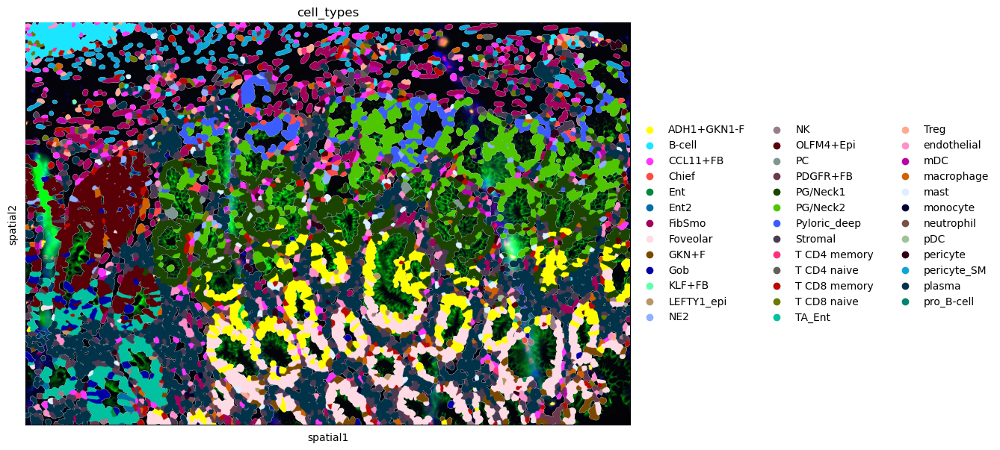

In [180]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sq.pl.spatial_segment(
    adata1,img=True,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="19",
    seg_cell_id="cell_ID",
    #img=False,
    size=60,
    ax=ax
)

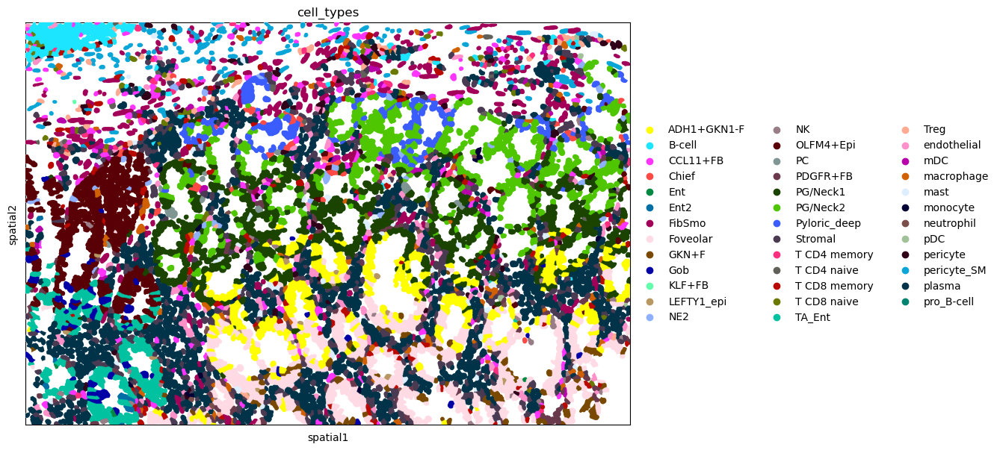

In [162]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sq.pl.spatial_segment(
    adata1,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="19",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax
)

ValueError: Found `library_id: `['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '3', '4', '5', '6', '7', '8', '9'] but no `library_key` was specified. Please specify `library_key`.

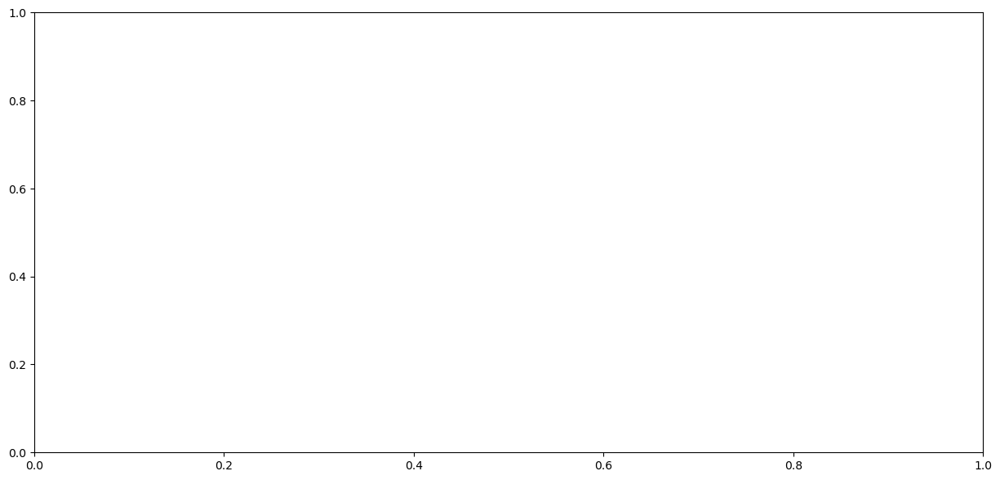

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
sq.pl.spatial_segment(
    adata_fov,
    shape="hex",
    color="cell_types",
    library_key="fov",
    library_id="1",
    seg_cell_id="cell_ID",
    img=False,
    size=60,
    ax=ax
)

# Cell-cell communication (COMMOT)

In [111]:
df_ligrec1 =ct.pp.ligand_receptor_database(database='CellChat', 
                                         species='human',signaling_type='Cell-Cell Contact')

In [112]:
df_ligrec2 =ct.pp.ligand_receptor_database(database='CellChat', 
                                         species='human',signaling_type='ECM-Receptor')

In [113]:
df_ligrec3 =ct.pp.ligand_receptor_database(database='CellChat', 
                                         species='human',signaling_type='Secreted Signaling')

In [120]:
df_ligrec = pd.concat([df_ligrec1,df_ligrec2,df_ligrec3])

In [121]:
df_ligrec = ct.pp.filter_lr_database(df_ligrec, adata, min_cell_pct=0.02)
print(df_ligrec.shape)

(369, 4)


In [166]:
df_ligrec = df_ligrec[df_ligrec[1]!='ITGA6_ITGB4']

In [123]:
ls = df_ligrec[df_ligrec[2] == 'WNT'][1]

In [124]:
print(pd.DataFrame(df_ligrec))

           0        1         2                   3
0     ADGRE5     CD55    ADGRE5   Cell-Cell Contact
1        APP     CD74       APP   Cell-Cell Contact
2     ENTPD1  ADORA2A      CD39   Cell-Cell Contact
3     CD40LG     CD40      CD40   Cell-Cell Contact
4      PTPRC     MRC1      CD45   Cell-Cell Contact
..       ...      ...       ...                 ...
364     GAS6    MERTK       GAS  Secreted Signaling
365   LGALS9    PTPRC  GALECTIN  Secreted Signaling
366  RARRES2   CMKLR1  CHEMERIN  Secreted Signaling
367   LGALS9   HAVCR2  GALECTIN  Secreted Signaling
368   LGALS9     CD44  GALECTIN  Secreted Signaling

[369 rows x 4 columns]


In [61]:
adata2.obs

,fov,Area,AspectRatio,CenterX_global_px,CenterY_global_px,Width,Height,Mean.MembraneStain,Max.MembraneStain,Mean.PanCK,...,Mean.CD45,Max.CD45,Mean.CD3,Max.CD3,Mean.DAPI,Max.DAPI,cell_ID,tissue,n_counts,cell_types
Fundic-fov001-cell_1,1,3079,1.63,-55722.222222,24600.777778,83,51,3366,17349,0,...,165,1481,0,129,2632,7901,1,Fundic,44,macrophage
Fundic-fov001-cell_2,1,1597,2.46,-52656.222222,24611.777778,69,28,73,1471,5,...,73,376,29,379,4119,11908,2,Fundic,20,pericyte
Fundic-fov001-cell_3,1,2006,1.36,-52438.222222,24604.777778,57,42,1873,17073,37,...,147,4677,19,304,3314,16796,3,Fundic,41,endothelial
Fundic-fov001-cell_5,1,1613,0.76,-55750.222222,24578.777778,44,58,1818,15023,0,...,939,2266,1,95,6665,10845,5,Fundic,28,B-cell
Fundic-fov001-cell_6,1,1782,1.29,-53238.222222,24586.777778,54,42,3452,16252,21,...,886,3650,49,453,9402,27557,6,Fundic,65,mast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fundic-fov024-cell_4849,24,2198,1.00,-25998.888889,-28980.666667,52,52,55991,58835,11100,...,2626,8129,381,1047,8580,22138,4849,Fundic,30,GKN+F
Fundic-fov024-cell_4856,24,2340,1.42,-25441.888889,-28998.666667,74,52,22108,54562,7941,...,548,3213,163,545,10575,27841,4856,Fundic,28,endothelial
Fundic-fov024-cell_4857,24,1154,0.75,-25700.888889,-28996.666667,36,48,49080,58835,9007,...,4935,10440,421,1202,15714,32536,4857,Fundic,21,T CD8 memory
Fundic-fov024-cell_4858,24,2392,2.63,-25500.888889,-29002.666667,92,35,17219,39562,2382,...,482,3513,137,446,10957,29081,4858,Fundic,21,pericyte


In [167]:
adata_fov = adata1[adata1.obs['fov']=="9",:]

In [168]:
df_ligrec[2].unique()

array(['ADGRE5', 'APP', 'CD39', 'CD40', 'CD45', 'CD80', 'CD86', 'CDH',
       'CDH1', 'CDH5', 'CEACAM', 'CLEC', 'EPHA', 'EPHB', 'ESAM', 'ICAM',
       'ICOS', 'ITGB2', 'MHC-I', 'MHC-II', 'NOTCH', 'PD-L1', 'PDL2',
       'PECAM1', 'SELL', 'SELPLG', 'VCAM', 'COLLAGEN', 'FN1', 'THBS',
       'VTN', 'TGFb', 'BMP', 'GDF', 'ACTIVIN', 'ncWNT', 'EGF', 'NRG',
       'FGF', 'PDGF', 'VEGF', 'IGF', 'INSULIN', 'CCL', 'CXCL', 'MIF',
       'CX3C', 'IL2', 'IL4', 'IL6', 'IL12', 'LIFR', 'OSM', 'IL10', 'IL1',
       'IL17', 'CSF', 'IL16', 'CSF3', 'IFN-I', 'IFN-II', 'TNF', 'LIGHT',
       'FASLG', 'TRAIL', 'NGF', 'TWEAK', 'CD70', 'CD137', 'OX40', 'GITRL',
       'BAFF', 'SPP1', 'ANGPTL', 'ANGPT', 'NPR1', 'NPR2', 'KIT', 'HGF',
       'ANNEXIN', 'GAS', 'GALECTIN', 'CHEMERIN'], dtype=object)

In [172]:
ct.tl.spatial_communication(adata_fov,
    database_name='user_database', 
                            df_ligrec=df_ligrec, 
                            dis_thr=100, 
                            heteromeric=True, 
                            pathway_sum=True)

In [131]:
dic = {'Foveolar':'#FFFFCC',
                                           'GKN+F':'#C7E9B4',
                                           'ADH1+GKN1-F':'#7FCDBB',
                                           'PG/Neck1':'#41B6C4',
                                           'Chief':'#2C7FB8',
                                           'PC':'#253494',
                                           'PG/Neck2':'#31A354',
                                           'Pyloric_deep':'#006837',
                                           'Ent':'#FEE5D9',
                                           'TA_Ent':'#FB6A4A',
                                           'Ent2':'#FCAE91',
                                           'OLFM4+Epi':'#CB181D',
                                           'Gob':'blue',
                                           'NE1':'Salmon',
                                           'NE2':'yellow',
                                           'LEFTY1_epi':'red',
                                           'B-cell':'#87CEEB',
                                           'pro_B-cell':'#90EE90',
                                           'plasma':'#DDA0DD',
                                           'T CD4 memory':'#696969',
                                           'T CD8 memory':'#556B2F',
                                           'T CD4 naive':'#696969',
                                           'T CD8 naive':'#556B2F',
                                           'Treg':'#800000',
                                           'NK':'black',
                                           'macrophage':'#F0E68C',
                                           'mast':'#F0E68C',
                                           'mDC':'#F0E68C',
                                           'monocyte':'#F0E68C',
                                           'pDC':'#F0E68C',
                                           'neutrophil':'#EE82EE',
                                           'CCL11+FB':'#4682B4',
                                           'KLF+FB':'Cyan',
                                           'PDGFR+FB':'Gray',
                                           'pericyte':'pink',
                                           'FibSmo':'#FFD700',
                                           'Stromal':'#ADFF2F',
                                           'pericyte_SM':'#FAFAD2',
                                           'endothelial':'#B22222'}

moji = []

for i in range(adata_fov.obs.index.shape[0]):
    index = adata_fov.obs.index[i]
    indexes = index.split('_')
    if i <=130044:
        if int(indexes[1]) < 10:
            moji.append('Pyloric-fov00'+indexes[1]+'-cell_'+indexes[0])
        else:
            moji.append('Pyloric-fov0'+indexes[1]+'-cell_'+indexes[0])
    '''else:
        if int(indexes[1]) < 10:
            moji.append('Fundic-fov00'+indexes[1]+'-cell_'+indexes[0])
        else:
            moji.append('Fundic-fov0'+indexes[1]+'-cell_'+indexes[0])'''

## important code

In [463]:
# subset adata by cellID
adata_sub = adata[adata.obs.index.isin(moji)]

In [ ]:
adata_fov.obs.index = moji

In [428]:
adata_fov.obs['cell_types'] = adata_sub.obs['cell_types']

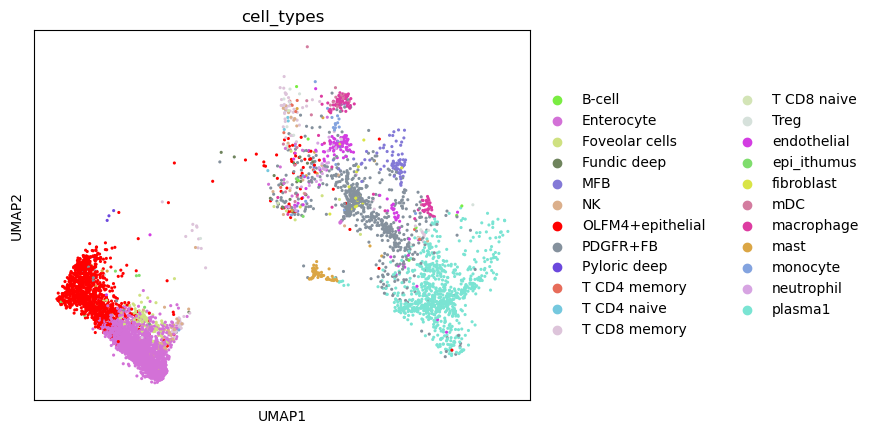

In [427]:
sc.pl.umap(adata_sub,
    color=[
        'cell_types'
    ],
    wspace=0.4,
    palette = dic
)

In [67]:
adata_fov.obs.dropna(inplace=True)

In [134]:
ct.tl.communication_direction(adata_fov, 
                              database_name='user_database', 
                              pathway_name='ncWNT', k=5)

In [177]:
ct.tl.communication_direction(adata_fov, lr_pair=('WNT5A','FZD5'),
                              database_name='user_database', k=5)

In [69]:
import cv2

In [83]:
adata2.uns['spatial']['13']['images']['hires']

array([[[  0,   1,   0],
        [  0,   3,  12],
        [  1,   3,  28],
        ...,
        [  0,   0, 107],
        [  1,   0, 111],
        [  1,   0, 113]],

       [[  0,   1,   4],
        [  0,   4,  16],
        [  2,   3,  33],
        ...,
        [  1,   0, 109],
        [  1,   0, 111],
        [  1,   0, 113]],

       [[  0,   0,   9],
        [  1,   4,  23],
        [  4,   4,  40],
        ...,
        [  2,   0, 110],
        [  2,   0, 112],
        [  2,   0, 114]],

       ...,

       [[  0,  14,   0],
        [ 22,  55,  28],
        [ 21,  60,  29],
        ...,
        [ 26,  15, 137],
        [ 28,  13, 138],
        [ 21,   6, 131]],

       [[  1,  15,   0],
        [ 26,  45,  26],
        [ 19,  44,  22],
        ...,
        [ 24,  15, 104],
        [ 27,  16, 108],
        [ 20,   9, 101]],

       [[  0,   3,   0],
        [  3,  14,   0],
        [  0,   7,   0],
        ...,
        [  0,   0,  57],
        [  1,   0,  60],
        [  0,   0,  58]]

In [173]:
adata_fov.uns['spatial']['1']['images']['hires'] = cv2.flip(adata1.uns['spatial']['9']['images']['hires'],0)

cv2.imshow("Image", cv2.flip(adata_fov.uns['spatial']['1']['images']['hires'],0))

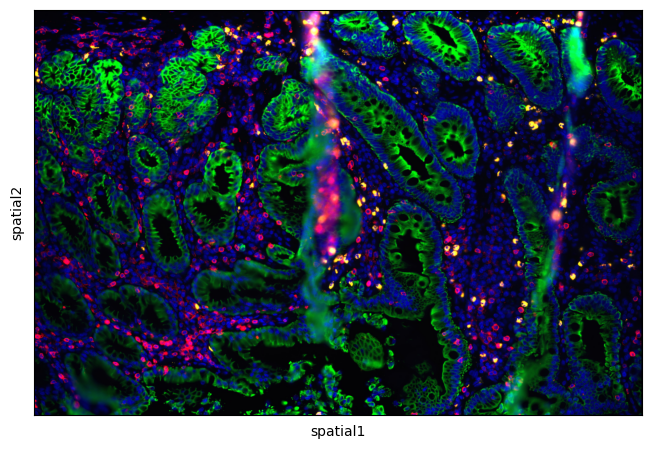

In [128]:
sq.pl.spatial_segment(adata_fov, library_key='fov',library_id='9',seg_cell_id='cell_ID',alpha=0)

<AxesSubplot: >

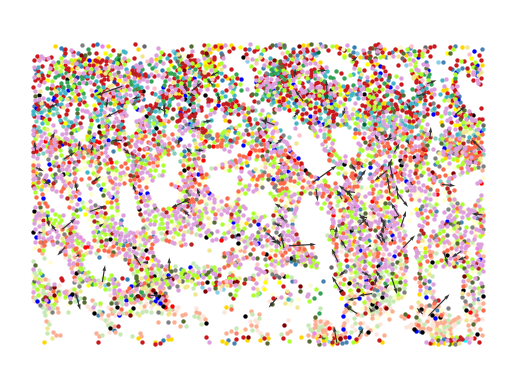

In [178]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=('WNT5A','FZD5'),
                              database_name='user_database', 
#                              pathway_name='ncWNT', 
                              plot_method='cell', 
                              background_legend=False,
                              scale=0.006, 
                              ndsize=10, 
                              grid_density=1, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995, )

<AxesSubplot: >

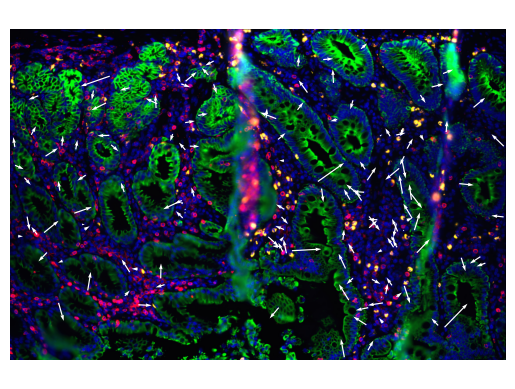

In [179]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=('WNT5A','FZD5'),
                              database_name='user_database', 
#                              pathway_name='ncWNT', 
                              plot_method='cell', 
                              background_legend=False,
                              scale=0.006, 
                              ndsize=10, 
                              grid_density=1, 
                              summary='sender', 
                              background='image',arrow_color='white', 
                              clustering='cell_types', cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995, )

<AxesSubplot: >

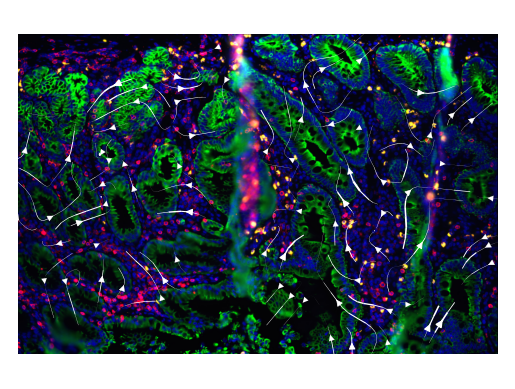

In [181]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=('WNT5A','FZD5'),
                              database_name='user_database', 
#                              pathway_name='ncWNT', 
                              plot_method='stream', 
                              background_legend=False,
                              scale=0.006, 
                              ndsize=10, 
                              grid_density=1, 
                              summary='sender', 
                              background='image',arrow_color='white', 
                              clustering='cell_types', cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995, )

In [139]:
ct.tl.communication_direction(adata_fov, 
                              database_name='user_database', 
                              pathway_name='BMP', k=10)

<AxesSubplot: >

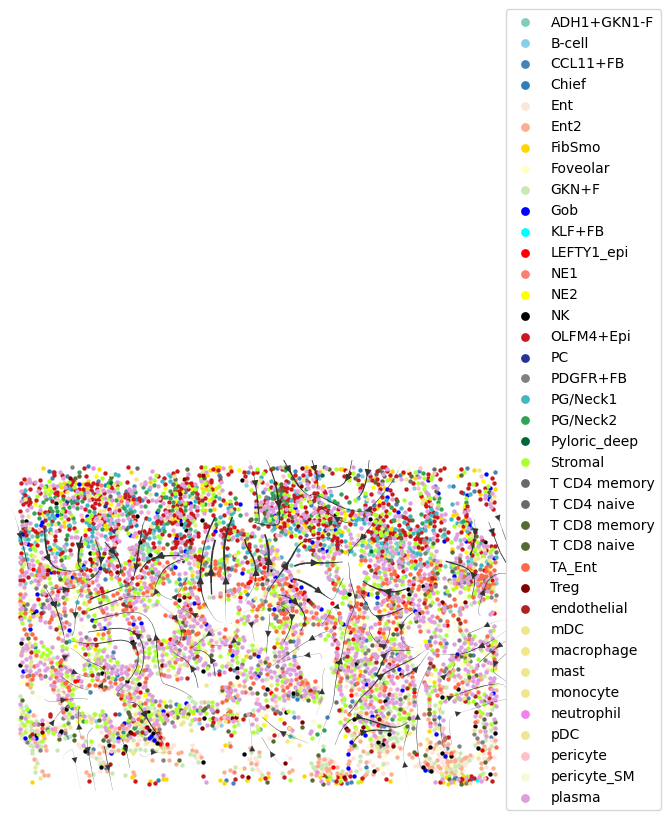

In [140]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='BMP', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

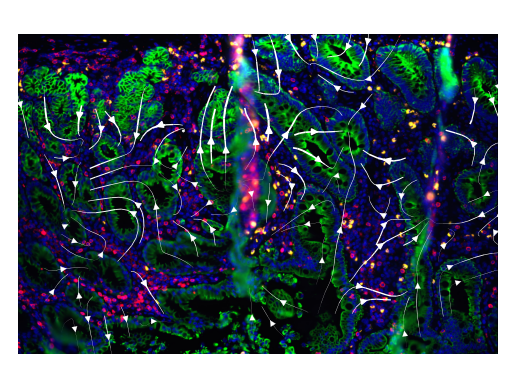

In [141]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='BMP', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white',
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

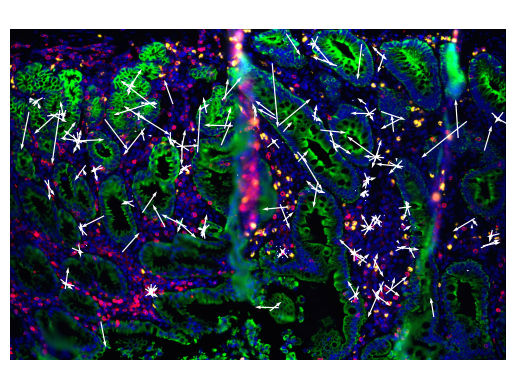

In [142]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='BMP', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.0035, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white',
                              clustering='cell_types', 
                            cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [182]:
ct.tl.communication_direction(adata_fov, lr_pair=['IGF1','IGF1R'],
                              database_name='user_database', k=10)

In [143]:
ct.tl.communication_direction(adata_fov, 
                              database_name='user_database', 
                              pathway_name='IGF', k=10)

<AxesSubplot: >

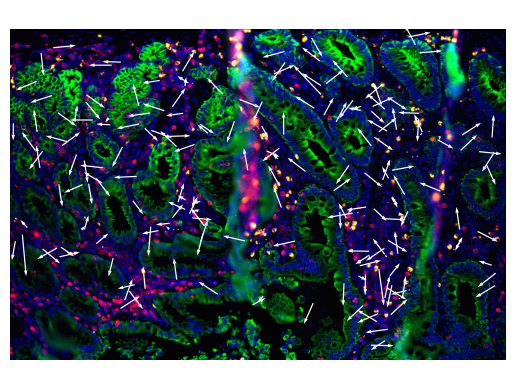

In [184]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['IGF1','IGF1R'],
                              database_name='user_database',  
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

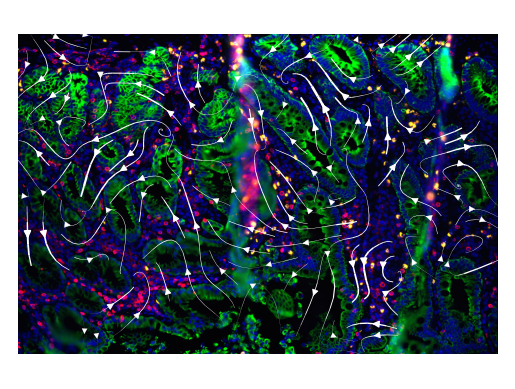

In [185]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['IGF1','IGF1R'],
                              database_name='user_database', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=1, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white',
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [149]:
ct.tl.communication_direction(adata_fov, 
                              database_name='user_database', 
                              pathway_name='MIF', k=10)

<AxesSubplot: >

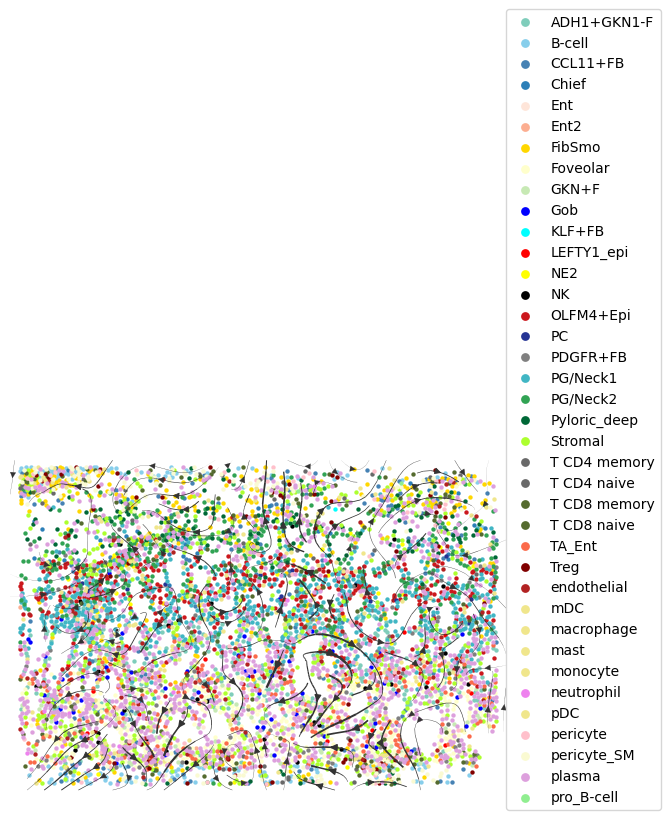

In [150]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='MIF', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [192]:
ct.tl.communication_direction(adata_fov, lr_pair=['NRG1','ERBB3'],
                              database_name='user_database', k=10)

In [203]:
ct.tl.communication_direction(adata_fov, lr_pair=['PDGFA','PDGFRA'],
                              database_name='user_database', k=10)

In [201]:
ct.tl.communication_direction(adata_fov, pathway_name='NRG',
                              database_name='user_database', k=10)

<AxesSubplot: >

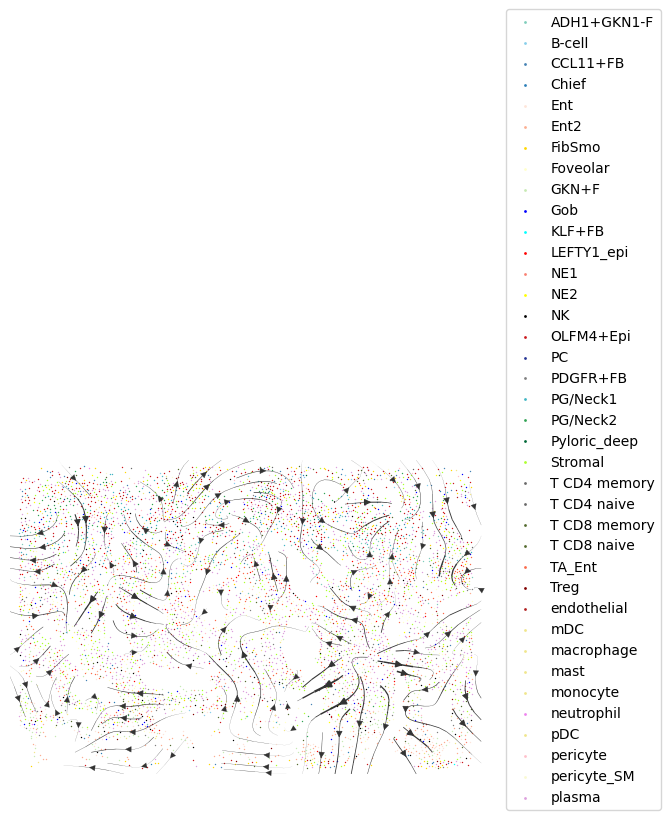

In [193]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['NRG1','ERBB3'],
                              database_name='user_database', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=1, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [203]:
ct.tl.communication_direction(adata_fov, lr_pair=['PDGFA','PDGFRA'],
                              database_name='user_database', k=10)

In [206]:
ct.tl.communication_direction(adata_fov, pathway_name='NOTCH',
                              database_name='user_database', k=10)

<AxesSubplot: >

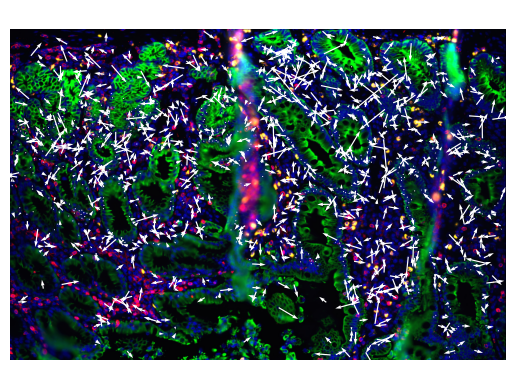

In [207]:
ct.pl.plot_cell_communication(adata_fov, pathway_name='NOTCH',
                              database_name='user_database', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

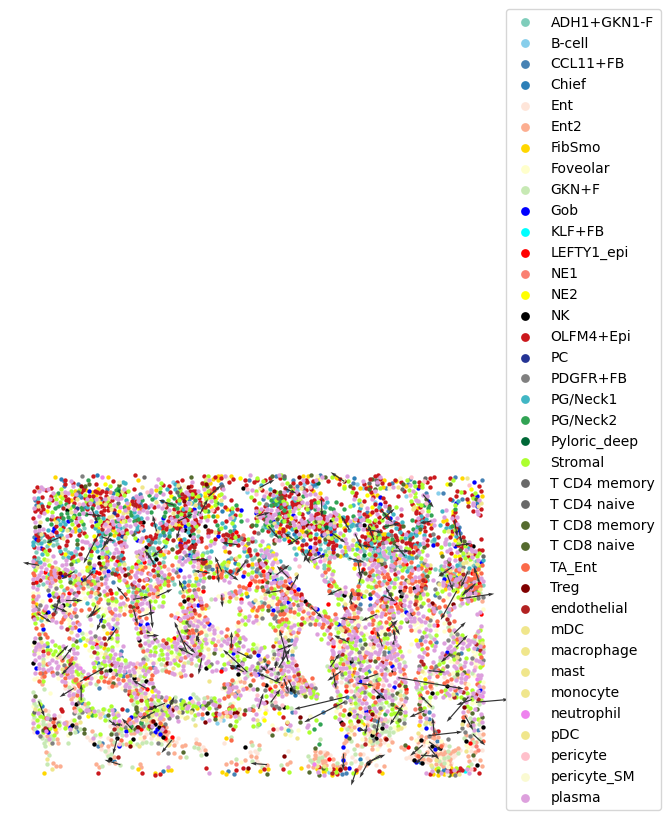

In [194]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['NRG1','ERBB3'],
                              database_name='user_database', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.005, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

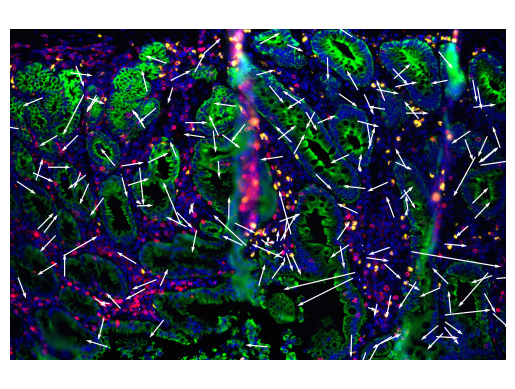

In [195]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['NRG1','ERBB3'],
                              database_name='user_database', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

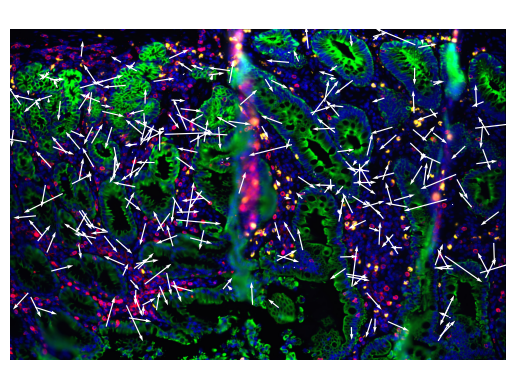

In [204]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['PDGFA','PDGFRA'],
                              database_name='user_database', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

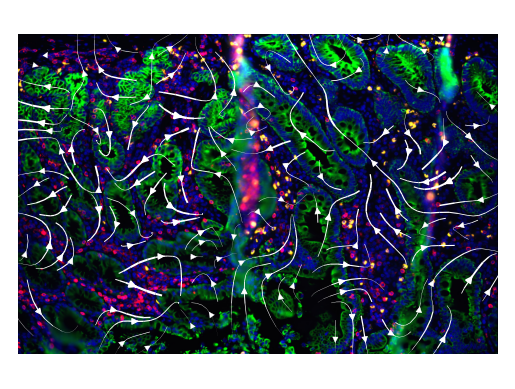

In [205]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['PDGFA','PDGFRA'],
                              database_name='user_database', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

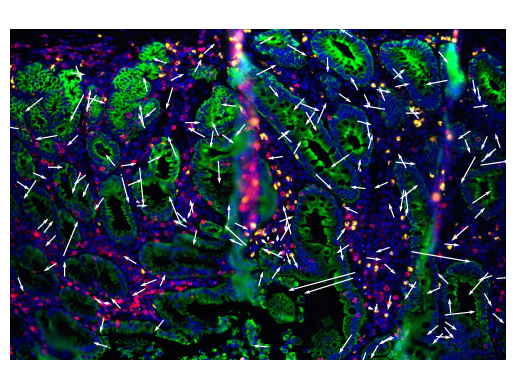

In [202]:
ct.pl.plot_cell_communication(adata_fov, pathway_name='NRG',
                              database_name='user_database', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

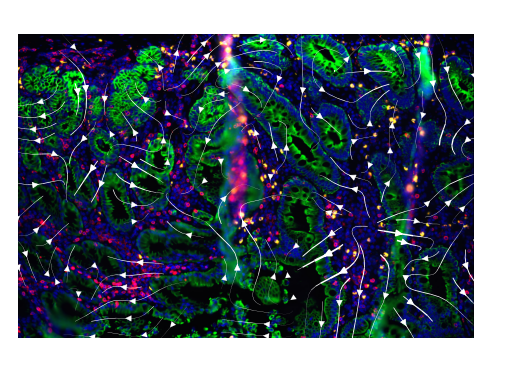

In [196]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['NRG1','ERBB3'],
                              database_name='user_database', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=1, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white',
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [198]:
ct.tl.communication_direction(adata_fov, lr_pair=['EFNB2','EPHB2'],
                              database_name='user_database', k=10)

<AxesSubplot: >

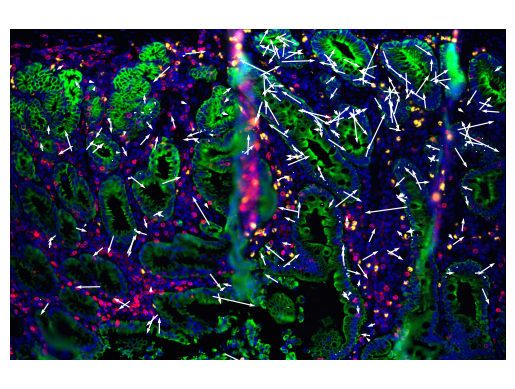

In [199]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['EFNB2','EPHB2'],
                              database_name='user_database',  
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.004, 
                              ndsize=15, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

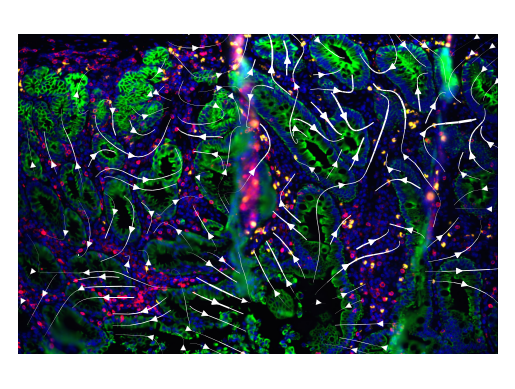

In [200]:
ct.pl.plot_cell_communication(adata_fov, lr_pair=['EFNB2','EPHB2'],
                              database_name='user_database',  
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.01, 
                              ndsize=1, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='image', arrow_color='white',
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

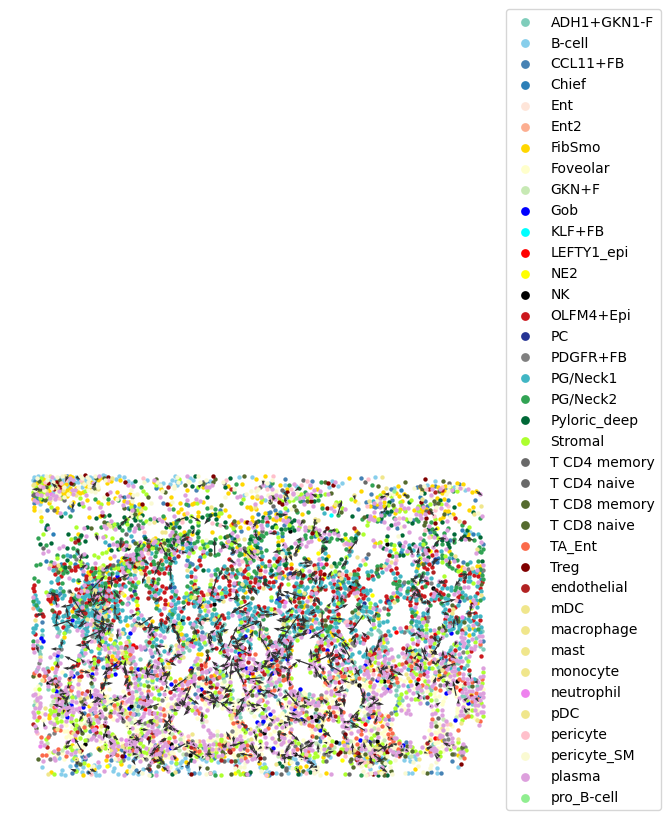

In [155]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='EPHB', 
                              plot_method='cell', 
                              background_legend=True,
                              scale=0.005, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

<AxesSubplot: >

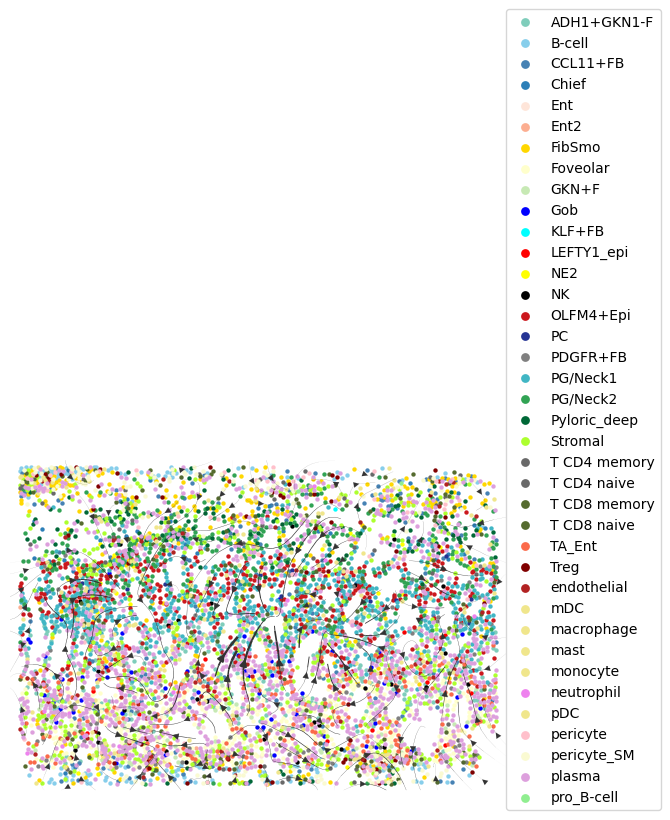

In [156]:
ct.pl.plot_cell_communication(adata_fov, 
                              database_name='user_database', 
                              pathway_name='EPHB', 
                              plot_method='stream', 
                              background_legend=True,
                              scale=0.005, 
                              ndsize=10, 
                              grid_density=0.6, 
                              summary='sender', 
                              background='cluster', 
                              clustering='cell_types', 
                              cluster_cmap=dic,
                              normalize_v = True, 
                              normalize_v_quantile=0.995)

In [154]:
1+1

2

In [536]:
adata_fov.write("./adata_fov13.h5ad")

# TradeSeq install後

In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [2]:
import commot as ct
import scanpy as sc
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

In [3]:
%matplotlib inline

In [4]:
adata_fov = sc.read_h5ad("./adata_fov13.h5ad")

In [5]:
import rpy2 as ro

In [6]:
import logging

In [7]:
import rpy2.situation

In [8]:
rpy2.situation.get_r_exec(rpy2.situation.get_r_home())

'/home/tsubosaka/anaconda3/envs/giotto-seurat/lib/R/bin/R'

In [9]:
import os

In [10]:
import anndata2ri

In [11]:
anndata2ri.__version__

'1.0.6'

In [12]:
rpy2.__version__

'3.4.2'

In [13]:
df_deg, df_yhat = ct.tl.communication_deg_detection(adata_fov, 
    database_name = 'user_database', pathway_name='WNT', summary = 'receiver')

  |                                                  | 0 % ~calculating   |+                                                 | 1 % ~02m 06s       |++                                                | 2 % ~01m 44s       |++                                                | 4 % ~01m 38s       |+++                                               | 5 % ~01m 30s       |++++                                              | 6 % ~01m 26s       |++++                                              | 8 % ~01m 23s       |+++++                                             | 9 % ~01m 27s       |+++++                                             | 10% ~01m 24s       |++++++                                            | 11% ~01m 20s       |+++++++                                           | 12% ~01m 23s       |+++++++                                           | 14% ~01m 20s       |++++++++                                          | 15% ~01m 23s       |+++++++++                                         | 16% ~01m 

NotImplementedError: Conversion 'rpy2py' not defined for objects of type '<class 'rpy2.robjects.methods.RS4'>'

In [ ]:
1+1